<a href="https://colab.research.google.com/github/LucasAbsalao/MFCC_to_SVM/blob/main/SinaiseSistemas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import librosa
import sklearn as sk
import scipy
import os
import pandas as pd
import matplotlib.pyplot as plt
import glob
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
#definindo o pré-processamento do dataset utilizado:




In [ ]:
#path = '/content/audios/right/*.wav'
#audiosList = glob.glob(path) #carrega todos os arquivos .mp3 que estão na pasta audios
#print(len(audiosList))
from google.colab import drive
drive.mount('/content/drive')
file_path='/content/drive/MyDrive/dataset_sinais/'
base_path= glob.glob(file_path + '/**/*.wav', recursive=True)
print(len(base_path))

Mounted at /content/drive
9563


In [ ]:
def get_features(mfcc,mel_spect,y):
  featstack = np.hstack((np.mean(mfcc, axis=1), np.std(mfcc, axis=1), scipy.stats.skew(mfcc, axis = 1), np.max(mfcc, axis = 1), np.median(mfcc, axis = 1), np.min(mfcc, axis = 1)))
  feat2 = librosa.feature.zero_crossing_rate(y)[0]
  feat2stack = np.hstack((np.mean(feat2), np.std(feat2), scipy.stats.skew(feat2, bias=False), np.max(feat2), np.median(feat2), np.min(feat2)))
  feat3 = librosa.feature.spectral_rolloff(y=y)[0] #a frequência abaixo da qual se encontra um certo percentual da energia espectral cumulativa (por padrão, 85%)
  feat3stack = np.hstack((np.mean(feat3), np.std(feat3), scipy.stats.skew(feat3,bias=False), np.max(feat3), np.median(feat3), np.min(feat3)))
  feat4 = librosa.feature.spectral_centroid(y=y)[0]
  feat4stack = np.hstack((np.mean(feat4), np.std(feat4), scipy.stats.skew(feat4, bias=False), np.max(feat4), np.median(feat4), np.min(feat4)))
  feat5 = librosa.feature.spectral_contrast(y=y)[0]
  feat5stack = np.hstack((np.mean(feat5), np.std(feat5), scipy.stats.skew(feat5, bias=False), np.max(feat5), np.median(feat5), np.min(feat5)))
  feat6 = librosa.feature.spectral_bandwidth(y=y)[0]
  feat6stack = np.hstack((np.min(feat6), np.std(feat6), scipy.stats.skew(feat6, bias=False), np.max(feat6), np.median(feat6), np.min(feat6)))
  mfcc_data = pd.Series(np.hstack((featstack, feat2stack, feat3stack, feat4stack, feat5stack, feat6stack)))
  return mfcc_data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
file_path='/content/drive/MyDrive/dataset_sinais/'
base_path= glob.glob(file_path + '/**/*.wav', recursive=True)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
file_path='/content/drive/MyDrive/dataset_sinais/'
#base_path= glob.glob(file_path + '/**/*.wav', recursive=True)
#path = '/content/audios/*/*.wav'
audiosList = glob.glob(file_path + '/**/*.wav', recursive=True) #carrega todos os arquivos .wav que estão na pasta audios
if not audiosList:
    print("Nenhum arquivo de áudio encontrado. Verifique o caminho.")

#print(audiosList)

all_mfccs = [] #lista de mfccs
names = [] #lista de nomes dos áudios
all_mfcc_datas = []

for audio in audiosList: #percorre todos os arquivos de audio
    #try:
      #obtem o nome do arquivo
      namesparts = audio.split('/')
      name = namesparts[-2]
      '''name = name.split('.')
      name = name[0]'''
      print(name)
      names.append(name)


      y, sr = librosa.load(audio, sr=None) #carrega o audio
      '''plt.plot(y)
      plt.title('Sinal')
      plt.xlabel('Tempo (amostras)')
      plt.ylabel('Amplitude')
      plt.show();'''


      spec = np.abs(librosa.stft(y, hop_length=512))
      spec = librosa.amplitude_to_db(spec, ref=np.max)
      '''librosa.display.specshow(spec, sr=sr, x_axis='time', y_axis='log')
      plt.colorbar(format='%+2.0f dB')
      plt.title('Spectrogram')
      plt.show();'''
      #calcula e plota o mel spectrogram
      mel_spect = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=2048, hop_length=1024)
      mel_spect = librosa.power_to_db(mel_spect, ref=np.max)
      '''librosa.display.specshow(mel_spect, y_axis='mel', fmax=8000, x_axis='time')
      plt.title('Mel Spectrogram')
      plt.colorbar(format='%+2.0f dB')'''

      ##antigo mfccs = librosa.feature.mfcc(y=y,sr=sr, n_mfcc=13)
      mfccs = librosa.feature.mfcc(S=mel_spect,sr=sr, n_mfcc=13) #Esse n_mfcc é a quantidade de coeficientes, eu deixei em 13 pq foi o do exemplo mas isso é algo bom da gente ver
      all_mfccs.append(mfccs)

      all_mfcc_datas.append(get_features(mfccs, mel_spect, y))
      '''plt.figure(figsize=(10, 4))
      librosa.display.specshow(mfccs, x_axis='time')
      plt.colorbar()
      plt.title('MFCC Visualization')
      plt.xlabel('Time')
      plt.ylabel('MFCC coefficients')
      plt.show()'''
    #except Exception as e:
      #print(f'Erro ao processar arquivo')

all_mfcc_datas = np.array(all_mfcc_datas)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
up
u

In [ ]:
'''print(all_mfccs[0])
mfcc = all_mfccs[0]
print("aaaa")
mfcc_data = []
for i in range(len(mfcc)):
    for j in range(len(mfcc[i])):
      mfcc_data.append(mfcc[i][j])
print(mfcc_data)'''
#a = (np.hstack(np.hstack(all_mfccs[0][0])))
#print(a)
print(all_mfccs)

[array([[-7.21072388e+02, -7.44889160e+02, -8.24092651e+02,
        -8.08157104e+02, -5.48831299e+02, -3.66867584e+02,
        -3.33657837e+02, -4.42662567e+02, -5.43961304e+02,
        -6.00492859e+02, -5.87513855e+02, -6.24433899e+02,
        -7.34975952e+02, -8.04396851e+02, -8.16473511e+02,
        -8.18541016e+02],
       [-2.81355228e+01,  1.28551922e+01,  5.19478569e+01,
         5.51654510e+01,  7.64138947e+01,  7.99084473e+01,
         5.41664391e+01, -3.29793549e+01, -7.88480682e+01,
        -1.15697906e+02, -9.77696838e+01, -5.68891983e+01,
         8.09894085e+00,  4.74016266e+01,  6.32159805e+01,
         5.87002563e+01],
       [-2.22868214e+01, -1.94075661e+01, -1.12542810e+01,
         1.13655844e+01,  5.52034454e+01, -1.78857384e+01,
        -1.68761749e+01,  7.40173721e+01,  7.67800140e+01,
         7.46194916e+01,  8.17658081e+01,  5.01323853e+01,
         1.84764099e+01,  9.17079687e-01, -7.30989742e+00,
        -6.99454927e+00],
       [-1.08328962e+01,  3.47322655

**ATENÇÃO BOIOLAS**: Essas partes comentadas são uma tentativa de usar os próprios coeficientes cepstrais como parâmetros, porém eles não têm tamanho constante e variam a depender do áudio (todos têm 13 coeficientes, mas cada coeficiente é um conjunto de valores e esse conjunto varia a depender do áudio em questão)

In [ ]:
all_mfcc_datas[0][77]

-36.432273864746094

In [ ]:
dataframe = pd.DataFrame()
dataframe['name'] = names
novas_colunas = [f'feature_{i}' for i in range(len(all_mfcc_datas[0]))]
for i, nome_coluna in enumerate(novas_colunas):
  dataframe[nome_coluna] = all_mfcc_datas[:, i]
  print(all_mfcc_datas[:,i])
#dataframe = dataframe['name'].apply(all_mfccs)

[-693.56921387 -620.27355957 -598.99450684 ... -581.84020996 -585.45837402
 -593.0949707 ]
[ 86.23077393  81.64273071 101.48636627 ...  43.69018173  72.21795654
  65.62557983]
[-20.58140564 -38.64074707 -34.99447632 ... -26.63955688 -33.67763901
  -5.14049053]
[12.17552757 20.9289875  17.57655907 ... 11.78871918  2.90031624
 16.22243118]
[ -2.95418119 -15.8114481    2.70470715 ...  -3.32650232   2.78057194
  -2.24706888]
[-15.68184566   1.28287721   4.91391182 ...   4.52016735  -6.01301241
   3.47593784]
[  2.61015177  -8.23596573 -14.73929977 ... -12.10880375  -8.10486698
  -3.50351477]
[-6.47855997 -2.28319001 -9.13753986 ...  3.70306158 19.85045052
 23.99399567]
[  2.95241427 -11.42098236  -4.75382614 ...   0.94242144 -19.68037033
  -8.07470798]
[-2.75306892 -1.33682227 -2.86587954 ...  1.8155998   6.09725475
 12.70840836]
[ -6.17811155 -23.35501099  -1.31274843 ...  -8.79740334 -14.14274311
  -7.47624302]
[  1.82109535 -10.13211918  -1.3363142  ...   2.68258977   2.43135571
   7.22

In [ ]:
print(dataframe.head())
dataframe = dataframe.fillna(0)

    name   feature_0   feature_1  feature_2  feature_3  feature_4  feature_5  \
0  right -693.569214   86.230774 -20.581406  12.175528  -2.954181 -15.681846   
1  right -620.273560   81.642731 -38.640747  20.928988 -15.811448   1.282877   
2  right -598.994507  101.486366 -34.994476  17.576559   2.704707   4.913912   
3  right -729.964600   87.839920  12.918667  29.713566   5.410365   4.430733   
4  right -621.703552   79.887558 -31.545372  39.559399  -9.442711  -3.773351   

   feature_6  feature_7  feature_8  ...  feature_80  feature_81  feature_82  \
0   2.610152  -6.478560   2.952414  ...    0.586841    0.373535    0.138428   
1  -8.235966  -2.283190 -11.420982  ...   -0.727874    0.210938    0.158936   
2 -14.739300  -9.137540  -4.753826  ...    0.814795    0.407227    0.154297   
3   1.322209  -1.679305   5.756011  ...    0.278540    0.217773    0.090088   
4 -10.559936   5.821027 -16.992441  ...    0.384409    0.354004    0.149658   

   feature_83   feature_84   feature_85  fea

In [ ]:
X_to_train = dataframe.drop(['name'], axis = 1)
X_to_train = X_to_train.values
labels = np.sort(np.unique(dataframe.name.values))
c2i = {}
i2c = {}
for i, c in enumerate(labels):
  i2c[i] = c
  c2i[c] = i
y = np.array([c2i[x] for x in dataframe.name.values])
print(y)

[5 5 5 ... 0 0 0]


In [ ]:
for i in range(len(X_to_train)):
    for j in range(len(X_to_train[i])):
      if np.isnan(X_to_train[i][j]):
        print(i,j)
#print(X_to_train[0])


In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_to_train)
pca = PCA(n_components=65).fit(X_scaled)
X_pca = pca.transform(X_scaled)

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X_pca,y, test_size=0.20, random_state=42, shuffle = True)
svc = SVC()
svc.fit(X_train, Y_train)

SVC()

In [ ]:
svc.score(X_test, Y_test)

0.7633365664403492

In [ ]:
Y_pred = svc.predict(X_test)
accuracy = sk.metrics.accuracy_score(Y_test, Y_pred)
print("Parametro de regularização: ", svc.C)
print("kernel: ", svc.kernel)
print("accuracy: ", accuracy)


Parametro de regularização:  1.0
kernel:  rbf
accuracy:  0.7633365664403492


In [ ]:
def matriz_confusao(labels, c2i, Y_pred, Y_test):
  rotulos = []
  for label in labels:
    rotulos.append(c2i[label])
  cm = sk.metrics.confusion_matrix(Y_test, Y_pred,labels=rotulos)
  cm_disp = sk.metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=rotulos)
  cm_disp.plot()

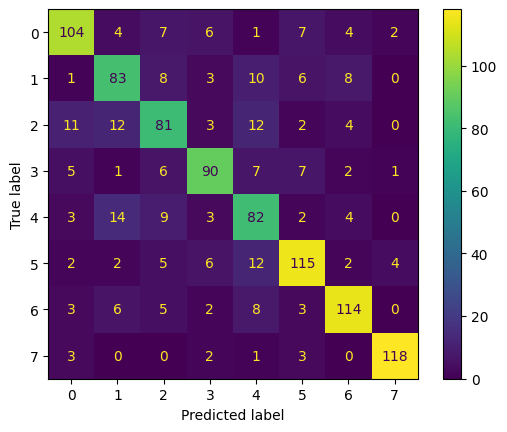

In [ ]:
matriz_confusao(labels,c2i,Y_pred,Y_test)

In [ ]:
param = {
    'kernel' : ['linear', 'poly', 'rbf', 'sigmoid'],
    #'gamma': [0.001, 0.01, 0.1, 1, 10],
    'C' : [.1, .4, .6, 1, 2, 3, 100, 200]
}
svm_grid = GridSearchCV(svc, param_grid = param)
svm_grid.fit(X_train, Y_train)

KeyboardInterrupt: 

In [ ]:
svm_grid.best_params_

{'C': 3}

In [ ]:
novo_svc = SVC(kernel = 'rbf', C = 3)
novo_svc.fit(X_train, Y_train)
novo_svc.score(X_test, Y_test)

0.7788554801163918

              precision    recall  f1-score   support

           0       0.79      0.80      0.80       135
           1       0.71      0.71      0.71       119
           2       0.66      0.69      0.67       125
           3       0.77      0.75      0.76       119
           4       0.68      0.75      0.72       117
           5       0.83      0.80      0.82       148
           6       0.83      0.80      0.82       141
           7       0.94      0.91      0.93       127

    accuracy                           0.78      1031
   macro avg       0.78      0.78      0.78      1031
weighted avg       0.78      0.78      0.78      1031



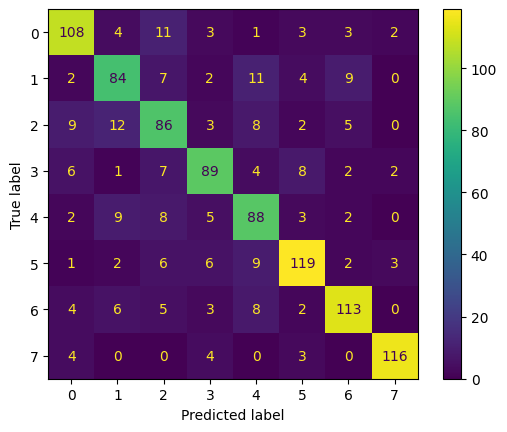

In [ ]:
novo_Y_pred = novo_svc.predict(X_test)
accuracy = sk.metrics.accuracy_score(Y_test, novo_Y_pred)
matriz_confusao(labels, c2i, novo_Y_pred, Y_test)
print(sk.metrics.classification_report(Y_test,novo_Y_pred))